# **Laboratory 3** : visualization with igraph

## References

https://networkx.org/

https://igraph.org/python/doc/igraph

https://igraph.org/python/doc/tutorial/tutorial.html

https://pyvis.readthedocs.io/en/latest/

## Setup

In [1]:
!pip install python-igraph

In [2]:
!pip install igraph

In [3]:
import pandas as pd
import networkx as nx
import igraph as ig
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

## Importing the data and creating a networkx graph

In [4]:
# Step 1: Import CSV files into pandas DataFrames
edges_df = pd.read_csv("edges.csv", delimiter=",", dtype={"weight": int})
nodes_df = pd.read_csv("nodes.csv", delimiter=",")

# Step 2: Create a NetworkX graph from the data
G_nx = nx.Graph()

# Add nodes with attributes
for _, row in nodes_df.iterrows():
    G_nx.add_node(row["word"], frequency=row["frequency"] , community=row["community"])

# Add edges with weights
for _, row in edges_df.iterrows():
    G_nx.add_edge(row["source_word"], row["target_word"], weight=row["weight"], source_community=row["source_community"], target_community=row["target_community"])

In [5]:
nodes_df["community"].unique()

array([ 6,  5,  2,  0,  3,  7, 11,  4,  1,  8,  9, 10, 12])

In [6]:
edges_df.head()

,Unnamed: 0,source,target,weight,source_word,target_word,source_community,target_community
0,0,3,2,12,car,electric,2,2
1,1,3,1,4,car,government,2,5
2,2,3,0,2,car,hate,2,6
3,3,2,1,2,electric,government,2,5
4,4,2,0,2,electric,hate,2,6


In [7]:
df = edges_df.drop(columns=['source', "target", "source_community", "target_community", "Unnamed: 0"])

In [8]:
df = df.reindex(columns=['source_word', 'target_word', 'weight'])

In [9]:
df

,source_word,target_word,weight
0,car,electric,12
1,car,government,4
2,car,hate,2
3,electric,government,2
4,electric,hate,2
...,...,...,...
16744,now,summer,1
16745,now,tired,1
16746,love,micro,1
16747,man,micro,1


In [10]:
df.to_csv("edges_snello.csv", index=False)

In [11]:
from google.colab import files
files.download("edges_snello.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Converting to igraph and calculating network properties

In [12]:
# Step 3: Convert NetworkX graph to iGraph
G_ig = ig.Graph.from_networkx(G_nx)
# Step 4: Calculate metrics in iGraph
G_ig.vs["degree"] = G_ig.degree()
G_ig.vs["pagerank"] = G_ig.pagerank()
G_ig.vs["modularity_class"] = G_ig.community_multilevel(weights="weight").membership

In [13]:
# Loop through each node (vertex) in the graph
for vertex in G_ig.vs:
    print(f"Node: {vertex['_nx_name']}")
    print(f"Degree: {vertex['degree']}")
    print(f"Community: {vertex['community']}")
    print(f"PageRank: {vertex['pagerank']}")
    print(f"Modularity Class: {vertex['modularity_class']}")
    print("-" * 50)


Node: hate
Degree: 43
Community: 6
PageRank: 0.0013369905362255274
Modularity Class: 0
--------------------------------------------------
Node: government
Degree: 56
Community: 5
PageRank: 0.001637752806650689
Modularity Class: 1
--------------------------------------------------
Node: electric
Degree: 33
Community: 2
PageRank: 0.0010650440776537795
Modularity Class: 0
--------------------------------------------------
Node: car
Degree: 120
Community: 2
PageRank: 0.0032624546844440506
Modularity Class: 0
--------------------------------------------------
Node: never
Degree: 121
Community: 0
PageRank: 0.0032831937819935127
Modularity Class: 1
--------------------------------------------------
Node: climate
Degree: 219
Community: 3
PageRank: 0.005817814876746184
Modularity Class: 2
--------------------------------------------------
Node: believe
Degree: 77
Community: 7
PageRank: 0.002150146241647277
Modularity Class: 3
--------------------------------------------------
Node: cycle
Degree

In [14]:
# Loop through each edge in the graph
for edge in G_ig.es:
    source = edge.source  # Source node of the edge
    target = edge.target  # Target node of the edge
    weight = edge['weight']  # Weight attribute of the edge
    #source_community = edge.source_community  # Source node of the edge
    #target_community = edge.target_community  # Target node of the edge
    print(f"Edge: {G_ig.vs[source]['_nx_name']} -> {G_ig.vs[target]['_nx_name']}")
    #print(f"Edge: {G_ig.vs[source_community]['_nx_name']} -> {G_ig.vs[target_community]['_nx_name']}")
    print(f"Weight: {weight}")
    print("-" * 50)

Output streaming troncato alle ultime 5000 righe.
Weight: 4
--------------------------------------------------
Edge: generation -> today
Weight: 4
--------------------------------------------------
Edge: generation -> home
Weight: 1
--------------------------------------------------
Edge: hot -> winter
Weight: 1
--------------------------------------------------
Edge: hot -> extremely
Weight: 2
--------------------------------------------------
Edge: hot -> fall
Weight: 2
--------------------------------------------------
Edge: hot -> weather
Weight: 3
--------------------------------------------------
Edge: hot -> Spain
Weight: 2
--------------------------------------------------
Edge: hot -> architecture
Weight: 2
--------------------------------------------------
Edge: hot -> research
Weight: 1
--------------------------------------------------
Edge: hot -> western
Weight: 1
--------------------------------------------------
Edge: hot -> UK
Weight: 4
--------------------------------

## Visualizing the graph

In [17]:
!pip install cairocffi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.4 MB/s eta 0:00:00


In [ ]:
#first time download cairocffi then restart the session without downloading it, only importing

In [18]:
import cairocffi as cairo

In [15]:
ig.plot(G_ig)

### Node size by degree

/usr/local/lib/python3.11/dist-packages/igraph/drawing/matplotlib/graph.py:719: UserWarning: Glyph 128128 (\N{SKULL}) missing from font(s) DejaVu Sans.
  art.draw(renderer, *args, **kwds)
/usr/local/lib/python3.11/dist-packages/igraph/drawing/matplotlib/graph.py:719: UserWarning: Glyph 128170 (\N{FLEXED BICEPS}) missing from font(s) DejaVu Sans.
  art.draw(renderer, *args, **kwds)
/usr/local/lib/python3.11/dist-packages/igraph/drawing/matplotlib/graph.py:719: UserWarning: Glyph 127477 (\N{REGIONAL INDICATOR SYMBOL LETTER P}) missing from font(s) DejaVu Sans.
  art.draw(renderer, *args, **kwds)
/usr/local/lib/python3.11/dist-packages/igraph/drawing/matplotlib/graph.py:719: UserWarning: Glyph 127480 (\N{REGIONAL INDICATOR SYMBOL LETTER S}) missing from font(s) DejaVu Sans.
  art.draw(renderer, *args, **kwds)
/usr/local/lib/python3.11/dist-packages/igraph/drawing/matplotlib/graph.py:719: UserWarning: Glyph 128591 (\N{PERSON WITH FOLDED HANDS}) missing from font(s) DejaVu Sans.
  art.draw(

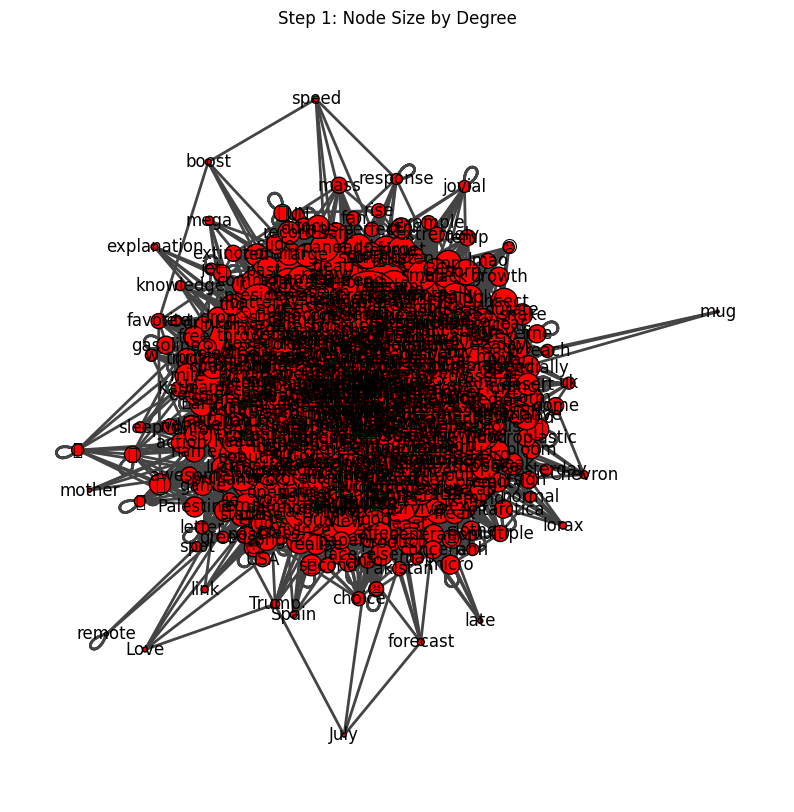

In [16]:
# Plot Step 1 Node size by degree
node_sizes = [1 * deg for deg in G_ig.vs["degree"]]  # Scale node size by degree

fig, ax = plt.subplots(figsize=(10, 10))  # Ensure the figure is set

ig.plot(
    G_ig,
    vertex_size=node_sizes,
    vertex_label = G_ig.vs["_nx_name"],
    target=ax,  # Plot directly into the axes
    margin=50
)

plt.title("Step 1: Node Size by Degree")
plt.show()


### Node color by community

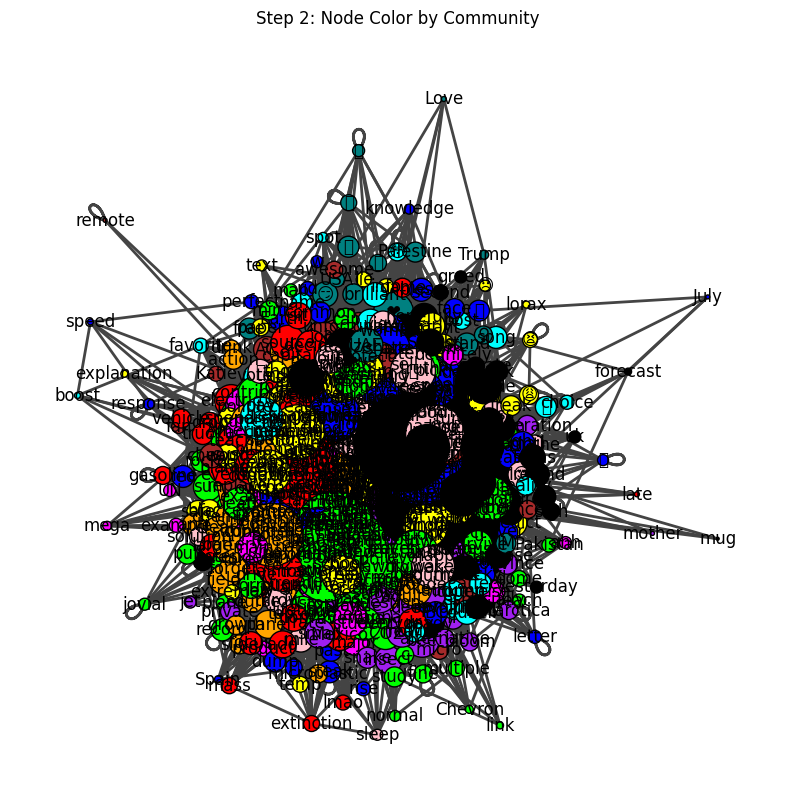

In [17]:
# Plot Step 2: Add node color by gender
numeri_colori = {
    0: "black",
    1: "blue",
    2: "red",
    3: "green",
    4: "yellow",
    5: "orange",
    6: "purple",
    7: "pink",
    8: "brown",
    9: "cyan",
    10: "magenta",
    11: "lime",
    12: "teal"
}

node_colors = [numeri_colori[community] for community in G_ig.vs["community"]]

fig, ax = plt.subplots(figsize=(10, 10))  # Ensure the figure is set

# Plot the graph
ig.plot(
    G_ig,
    vertex_size=node_sizes,
    vertex_color=node_colors,
    vertex_label=G_ig.vs["_nx_name"],
    target=ax,
    margin=50
)

plt.title("Step 2: Node Color by Community")
plt.show()


### Edge thickness by weight

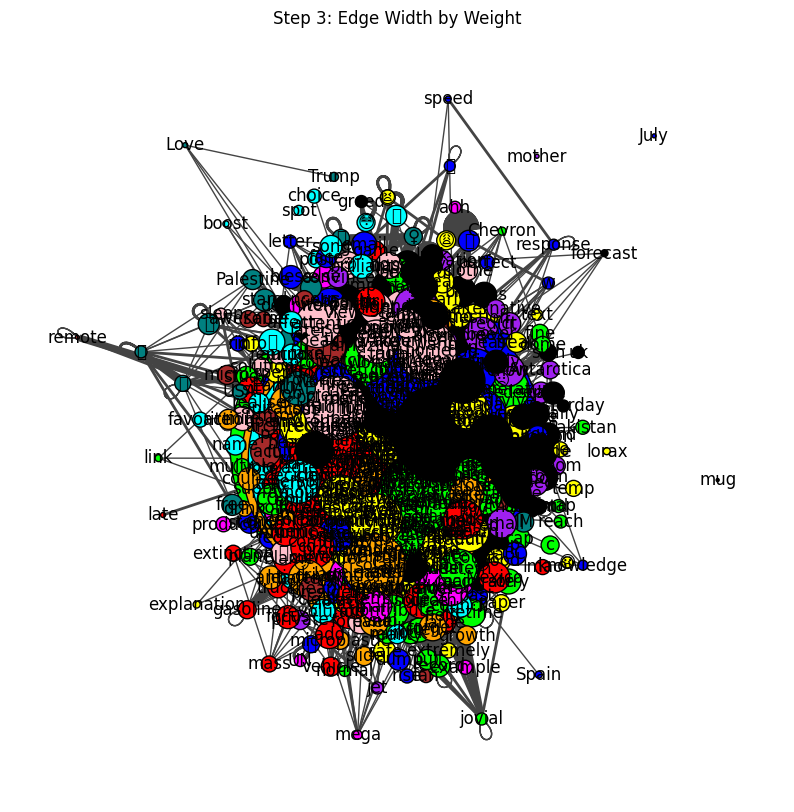

In [18]:
# Plot Step 2: Add node color by gender
edge_weights = [int(weight/3) for weight in G_ig.es["weight"]]

fig, ax = plt.subplots(figsize=(10, 10))

# Plot the graph
ig.plot(
    G_ig,
    vertex_size=node_sizes,
    vertex_color=node_colors,
    vertex_label=G_ig.vs["_nx_name"],
    edge_width=edge_weights,
    target=ax,
    margin=50
)

plt.title("Step 3: Edge Width by Weight")
plt.show()


### Applying a force-based layout algorithm

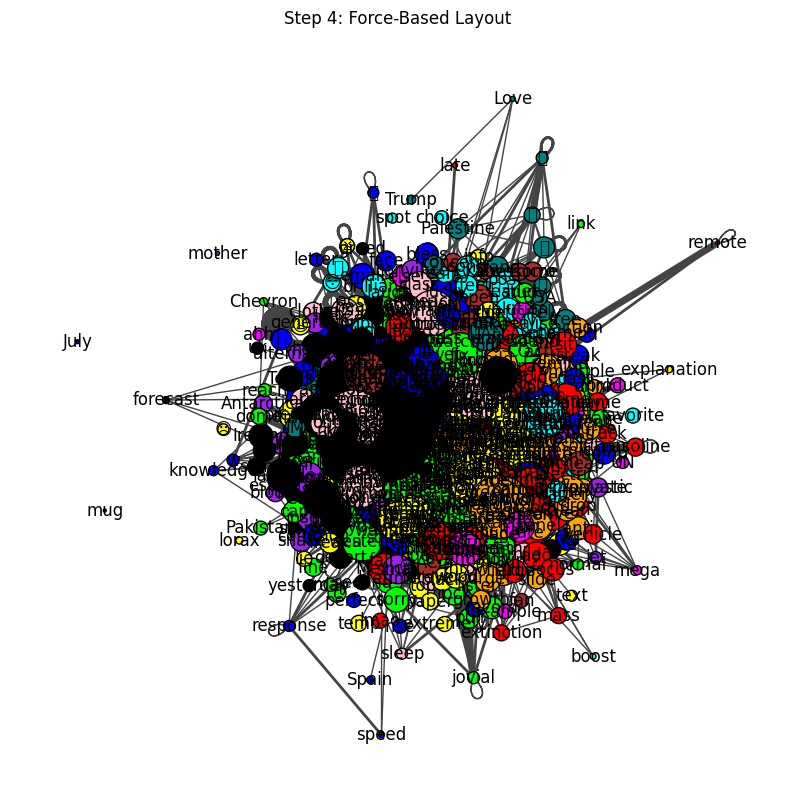

In [19]:
# Apply force-based layout (Fruchterman-Reingold)
layout_fr = G_ig.layout_fruchterman_reingold()

# Step 4: Force-Based Layout
fig, ax = plt.subplots(figsize=(10, 10))

ig.plot(
    G_ig,
    vertex_size=node_sizes,
    vertex_color=node_colors,
    vertex_label=G_ig.vs["_nx_name"],
    edge_width=edge_weights,
    layout=layout_fr,
    target=ax,
    margin=50
)

plt.title("Step 4: Force-Based Layout")
plt.show()


### Node size by pagerank, node color by modularity

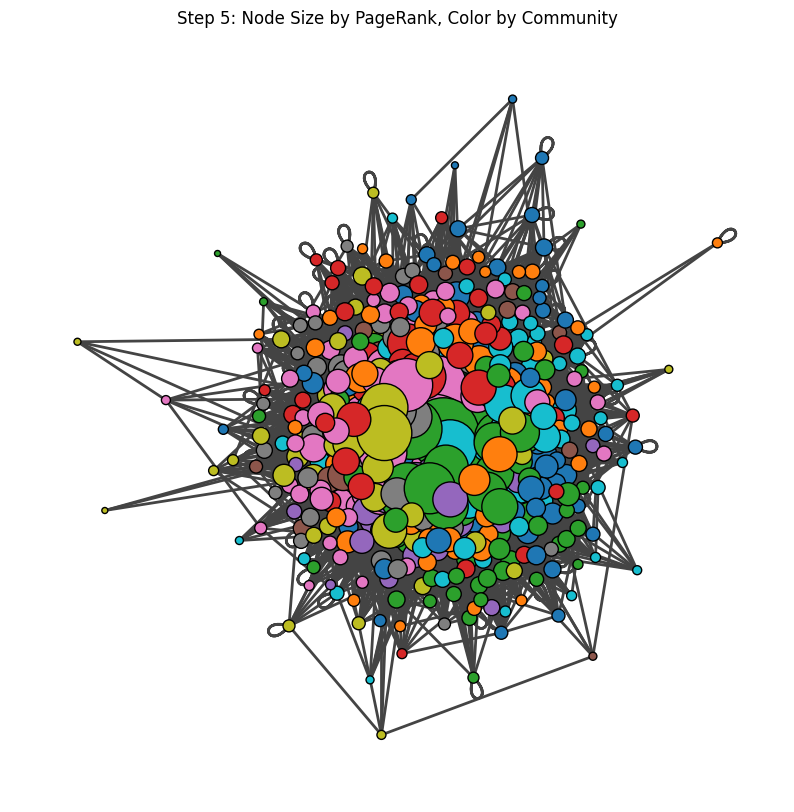

In [20]:
# Step 5: Resize nodes by PageRank and recolor by modularity
node_sizes_pagerank = [20000 * pr for pr in G_ig.vs["pagerank"]]
community_colors = list(mcolors.TABLEAU_COLORS.values())
node_colors_community = [
    community_colors[mod % len(community_colors)] for mod in G_ig.vs["modularity_class"]
]

fig, ax = plt.subplots(figsize=(10, 10))

ig.plot(
    G_ig,
    #vertex_size=node_sizes_pagerank,
    vertex_size=node_sizes_pagerank,
    vertex_color=node_colors_community,
    #vertex_label=G_ig.vs["_nx_name"],
    #edge_width=edge_weights,
    layout=layout_fr,
    target=ax,
    margin=50
)

plt.title("Step 5: Node Size by PageRank, Color by Community")
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128128 (\N{SKULL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128170 (\N{FLEXED BICEPS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127477 (\N{REGIONAL INDICATOR SYMBOL LETTER P}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127480 (\N{REGIONAL INDICATOR SYMBOL LETTER S}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128591 (\N{PERSON WITH FOLDED HANDS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(b

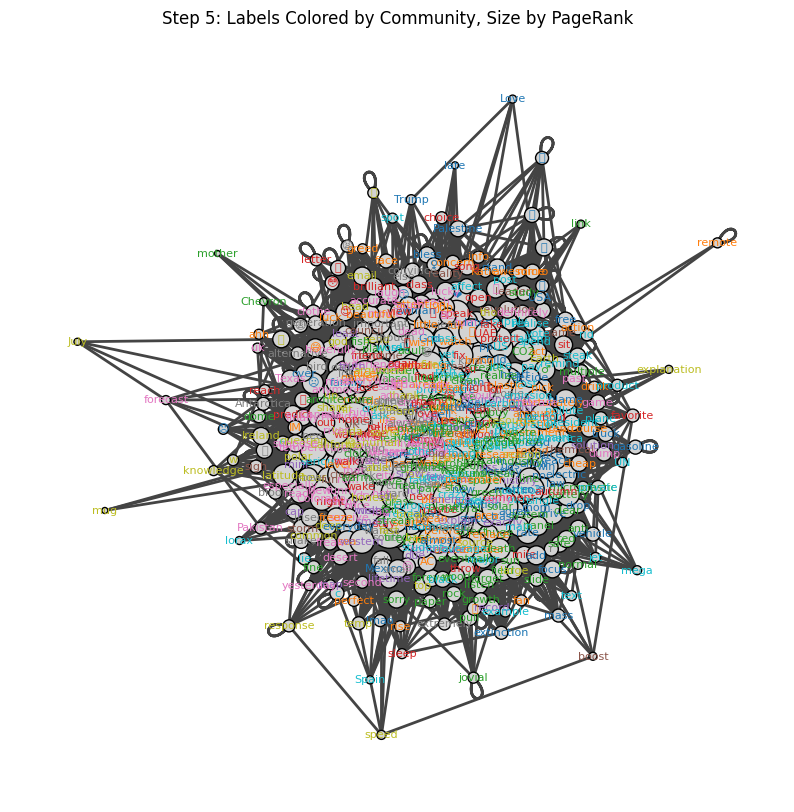

In [21]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import igraph as ig

# Creiamo il grafico senza etichette colorate
fig, ax = plt.subplots(figsize=(10, 10))

ig.plot(
    G_ig,
    vertex_size=node_sizes_pagerank,  # Grandezza nodo basata su PageRank
    vertex_color="lightgray",  # Nodi in grigio per non sovraccaricare il grafico
    vertex_label=None,  # Nasconde le etichette
    layout=layout_fr,
    target=ax,
    margin=50
)

# Ora aggiungiamo le etichette colorate manualmente
for v, label, color in zip(G_ig.vs, G_ig.vs["_nx_name"], node_colors_community):
    x, y = layout_fr[v.index]  # Prendiamo la posizione del nodo
    ax.text(x, y, label, fontsize=8, ha="center", va="center", color=color)

plt.title("Step 5: Labels Colored by Community, Size by PageRank")
plt.show()

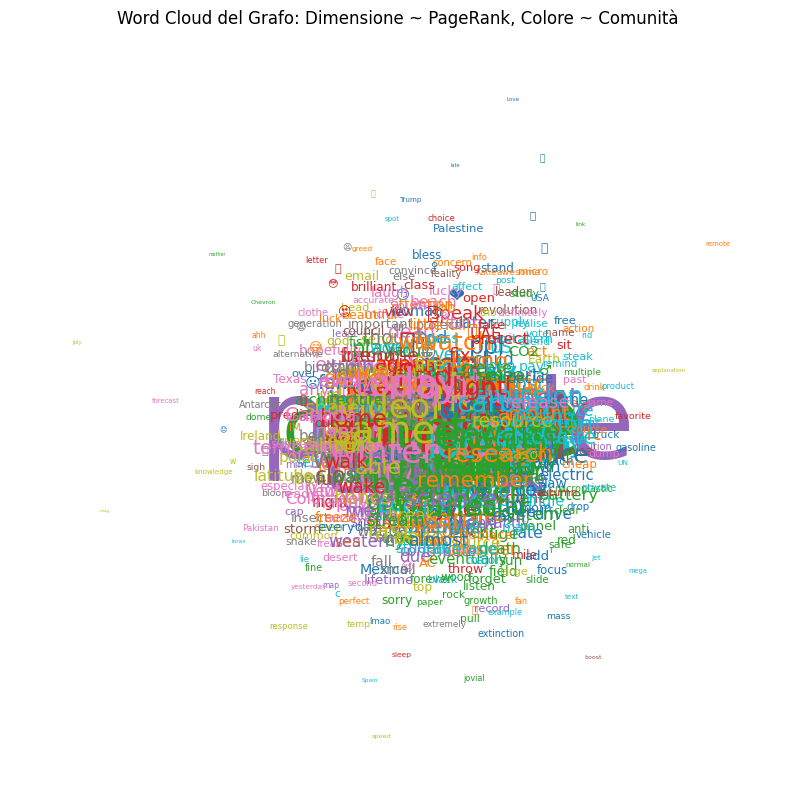

In [22]:
import matplotlib.pyplot as plt
import igraph as ig

fig, ax = plt.subplots(figsize=(10, 10))

# Disegniamo il grafo SENZA nodi né archi
ig.plot(
    G_ig,
    vertex_size=0,  # Niente nodi
    vertex_color="white",  # Invisibili
    edge_color="white",  # Niente archi
    vertex_label=None,  # Niente etichette di default
    layout=layout_fr,
    target=ax,
    margin=50
)

# Aggiungiamo le parole manualmente, scalate per PageRank
for v, label, color, size in zip(G_ig.vs, G_ig.vs["_nx_name"], node_colors_community, node_sizes_pagerank):
    x, y = layout_fr[v.index]  # Posizione del nodo
    ax.text(x, y, label, fontsize=size/2, ha="center", va="center", color=color)

plt.title("Word Cloud del Grafo: Dimensione ~ PageRank, Colore ~ Comunità")
plt.show()

In [23]:
!pip install adjustText

/usr/local/lib/python3.11/dist-packages/adjustText/__init__.py:419: UserWarning: Glyph 128128 (\N{SKULL}) missing from font(s) DejaVu Sans.
  ax.figure.draw_without_rendering()
/usr/local/lib/python3.11/dist-packages/adjustText/__init__.py:419: UserWarning: Glyph 128170 (\N{FLEXED BICEPS}) missing from font(s) DejaVu Sans.
  ax.figure.draw_without_rendering()
/usr/local/lib/python3.11/dist-packages/adjustText/__init__.py:419: UserWarning: Glyph 127477 (\N{REGIONAL INDICATOR SYMBOL LETTER P}) missing from font(s) DejaVu Sans.
  ax.figure.draw_without_rendering()
/usr/local/lib/python3.11/dist-packages/adjustText/__init__.py:419: UserWarning: Glyph 127480 (\N{REGIONAL INDICATOR SYMBOL LETTER S}) missing from font(s) DejaVu Sans.
  ax.figure.draw_without_rendering()
/usr/local/lib/python3.11/dist-packages/adjustText/__init__.py:419: UserWarning: Glyph 128591 (\N{PERSON WITH FOLDED HANDS}) missing from font(s) DejaVu Sans.
  ax.figure.draw_without_rendering()
/usr/local/lib/python3.11/dist

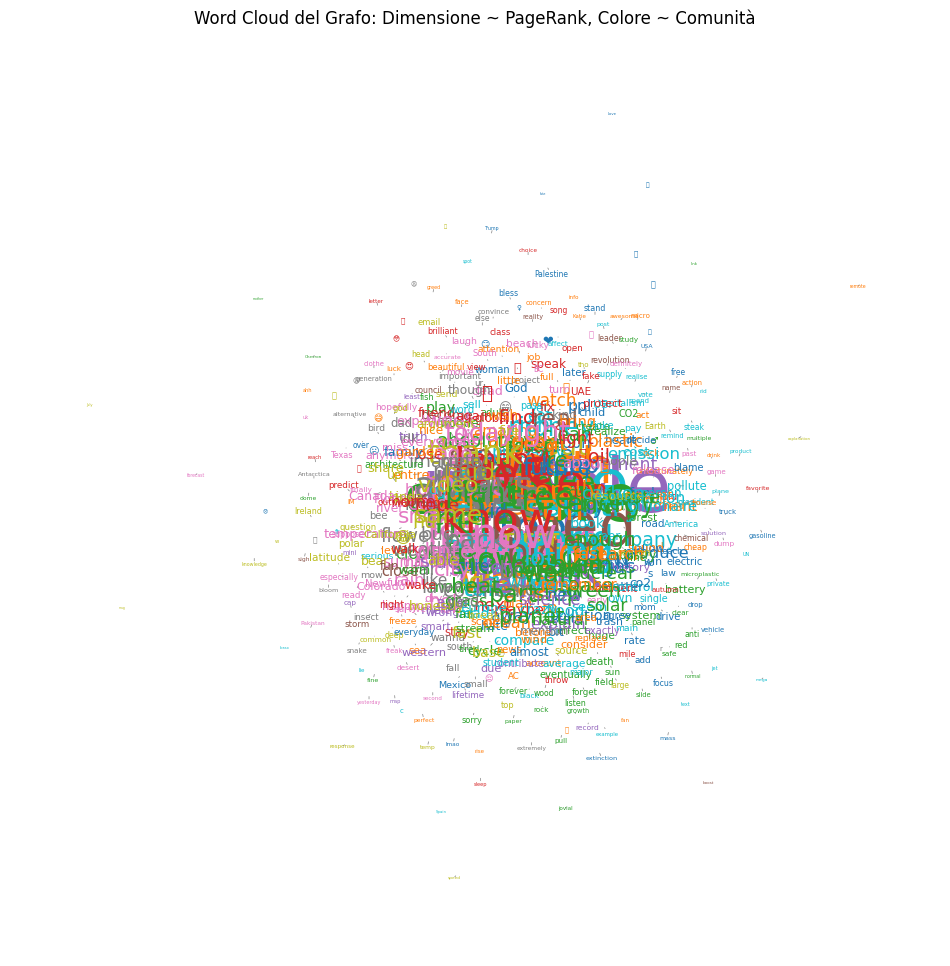

In [24]:
import matplotlib.pyplot as plt
from adjustText import adjust_text  # Libreria per evitare sovrapposizioni
import igraph as ig

fig, ax = plt.subplots(figsize=(12, 12))

# Disegniamo il grafo SENZA nodi né archi
ig.plot(
    G_ig,
    vertex_size=0,  # Niente nodi
    vertex_color="white",  # Invisibili
    edge_color="white",  # Niente archi
    vertex_label=None,  # Niente etichette di default
    layout=layout_fr,
    target=ax,
    margin=50
)

# Lista per raccogliere le etichette e spostarle dopo
texts = []

for v, label, color, size in zip(G_ig.vs, G_ig.vs["_nx_name"], node_colors_community, node_sizes_pagerank):
    x, y = layout_fr[v.index]  # Posizione nodo
    text = ax.text(x, y, label, fontsize=size / 3, ha="center", va="center", color=color)
    texts.append(text)

# **Aggiustiamo le etichette per evitare sovrapposizioni**
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray", lw=0.5))

plt.title("Word Cloud del Grafo: Dimensione ~ PageRank, Colore ~ Comunità")
plt.show()

## Interactive visualization

In [25]:
!pip install pyvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.3 MB/s eta 0:00:00


In [26]:
# Convert iGraph to NetworkX
G_nx = nx.Graph()

# Convert the nodes
for v in G_ig.vs:
    node_attrs = {key: v[key] for key in v.attributes()}  # Extract node attributes
    G_nx.add_node(v['_nx_name'], **node_attrs)  # Add node with attributes

# Convert the edges
for e in G_ig.es:
    G_nx.add_edge(G_ig.vs[e.source]['_nx_name'], G_ig.vs[e.target]['_nx_name'], weight=e['weight'])

# Check the resulting NetworkX graph
print("Nodes in NetworkX graph:", G_nx.nodes(data=True))
print("Edges in NetworkX graph:", G_nx.edges(data=True))

Nodes in NetworkX graph: [('hate', {'_nx_name': 'hate', 'frequency': 16, 'community': 6, 'degree': 43, 'pagerank': 0.0013369905362255274, 'modularity_class': 0}), ('government', {'_nx_name': 'government', 'frequency': 27, 'community': 5, 'degree': 56, 'pagerank': 0.001637752806650689, 'modularity_class': 1}), ('electric', {'_nx_name': 'electric', 'frequency': 13, 'community': 2, 'degree': 33, 'pagerank': 0.0010650440776537795, 'modularity_class': 0}), ('car', {'_nx_name': 'car', 'frequency': 71, 'community': 2, 'degree': 120, 'pagerank': 0.0032624546844440506, 'modularity_class': 0}), ('never', {'_nx_name': 'never', 'frequency': 53, 'community': 0, 'degree': 121, 'pagerank': 0.0032831937819935127, 'modularity_class': 1}), ('climate', {'_nx_name': 'climate', 'frequency': 150, 'community': 3, 'degree': 219, 'pagerank': 0.005817814876746184, 'modularity_class': 2}), ('believe', {'_nx_name': 'believe', 'frequency': 29, 'community': 7, 'degree': 77, 'pagerank': 0.002150146241647277, 'modula

In [27]:
from pyvis.network import Network
from IPython.display import display, HTML


# Create a pyvis network object
net = Network(notebook=True, cdn_resources='in_line')

# Add NetworkX graph to pyvis
net.from_nx(G_nx)

# Show the network in an HTML file
net.show("network.html")


network.html


In [28]:
display(HTML('network.html'))


In [29]:
from pyvis.network import Network
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Assuming G is your NetworkX graph

G = G_nx
# Create a PyVis network object
net = Network(notebook=True, cdn_resources='in_line')

# Define colors based on modularity classes
modularity_classes = list(set(nx.get_node_attributes(G, 'modularity_class').values()))
mod_colors = plt.cm.viridis(np.linspace(0, 1, len(modularity_classes)))

# Map modularity class to a color
modularity_color_map = {mod_class: mod_colors[i] for i, mod_class in enumerate(modularity_classes)}

# Add nodes to PyVis network
for node in G.nodes:
    mod_class = G.nodes[node]['modularity_class']
    pagerank = G.nodes[node].get('pagerank', 0)  # Default to 0 if no pagerank attribute
    size = 20 + 500 * pagerank  # Scaling size based on PageRank
    color = modularity_color_map.get(mod_class, 'gray')  # Default to gray if no modularity class
    label = G.nodes[node].get('_nx_name', node)  # Default to node name if no _nx_name attribute

    # Ensure color is in RGB format or hex string
    if isinstance(color, np.ndarray):  # If color is an ndarray, convert to hex
        color = '#{:02x}{:02x}{:02x}'.format(int(color[0]*255), int(color[1]*255), int(color[2]*255))

    # Add node to PyVis network with size and color
    net.add_node(node, label=label, size=int(size), color=color)

# Add edges to PyVis network
for u, v in G.edges:
    net.add_edge(u, v)

# Show the network
net.show("network_graph.html")


network_graph.html


In [30]:
display(HTML('network_graph.html'))
